In [15]:
import random
import numpy as np
import torch
from model_256 import ConditionalGANomaly  # Shifted_VAE 정의된 파일
import os
from torchvision import transforms
import torch.nn.functional as F
from torch.utils.data import DataLoader, Dataset
from PIL import Image
import matplotlib.pyplot as plt

In [16]:
# 기본 설정
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
input_channels = 3  # RGB 이미지
latent_dim = 128  # 잠재 공간 크기
condition_dim = 8  # 클래스 개수

batch_size = 16
image_size = (224, 224)

checkpoint_path = "./best_model.pth"  # 가중치 경로

# 모델 초기화
model = ConditionalGANomaly(input_channels, latent_dim, condition_dim).to(device)

# 가중치 로드
checkpoint = torch.load(checkpoint_path, map_location=device)
model.load_state_dict(checkpoint)

print("Model weights loaded from", checkpoint_path)

Model weights loaded from ./best_model.pth


In [17]:
class MultiFolderDataset(Dataset):
    def __init__(self, data_list, transform=None):
        """
        data_list: [(img_path, label), ...] 형태의 리스트
        """
        self.data_list = data_list
        self.transform = transform

    def __len__(self):
        return len(self.data_list)

    def __getitem__(self, idx):
        img_path, label = self.data_list[idx]
        image = Image.open(img_path).convert("RGB")
        if self.transform:
            image = self.transform(image)
        return image, label

def get_test_dataloader(test_dir, chosen_folder, batch_size, image_size):
    """
    test 폴더 내 각 서브폴더명 -> 라벨 할당 후 chosen_folder 내 이미지로 데이터셋 구성.
    모든 클래스에서 동일한 수만큼 이미지를 랜덤 선택 후 통합한 데이터셋과 전체 데이터셋 반환.

    Args:
        test_dir (str): test 폴더 경로
        chosen_folder (str): 'Pass_cropped' 또는 'Fail_cropped' 중 하나
        batch_size (int): 배치 크기
        image_size (tuple): (H, W) 원하는 이미지 크기

    Returns:
        balanced_loader (DataLoader): 각 클래스에서 동일한 수만큼 샘플링한 데이터로 구성된 DataLoader
        full_loader (DataLoader): 각 클래스의 모든 데이터를 포함한 DataLoader
    """

    # test 폴더 내 서브폴더(클래스 폴더) 탐색
    class_names = [d for d in os.listdir(test_dir) if os.path.isdir(os.path.join(test_dir, d))]
    class_names.sort()  # 알파벳 순 정렬
    class_to_idx = {cls_name: idx for idx, cls_name in enumerate(class_names)}

    # 각 클래스 폴더에서 chosen_folder 내 이미지 경로 수집
    class_image_paths = {}
    for cls_name in class_names:
        cls_path = os.path.join(test_dir, cls_name, chosen_folder)
        if not os.path.isdir(cls_path):
            raise ValueError(f"Chosen folder '{chosen_folder}' does not exist in {cls_name}")

        images = [os.path.join(cls_path, f) for f in os.listdir(cls_path)
                  if f.lower().endswith(('.jpg', '.jpeg', '.png'))]

        if len(images) == 0:
            raise ValueError(f"No images found in {cls_path}")

        class_image_paths[cls_name] = images

    # 각 클래스별 이미지 수 파악 -> 최소 개수에 맞춰 샘플링
    min_count = min(len(imgs) for imgs in class_image_paths.values())

    # Balanced Dataset 생성: 모든 클래스에서 min_count만큼 랜덤 샘플링
    balanced_data_list = []
    for cls_name, imgs in class_image_paths.items():
        label = class_to_idx[cls_name]
        selected_imgs = random.sample(imgs, min_count)
        for img_path in selected_imgs:
            balanced_data_list.append((img_path, label))

    # Full Dataset 생성: 모든 데이터를 포함
    full_data_list = []
    for cls_name, imgs in class_image_paths.items():
        label = class_to_idx[cls_name]
        for img_path in imgs:
            full_data_list.append((img_path, label))

    # Transform 정의
    transform = transforms.Compose([
        transforms.Resize(image_size),
        transforms.ToTensor()
    ])

    # Dataset 및 DataLoader 생성
    balanced_dataset = MultiFolderDataset(balanced_data_list, transform=transform)
    balanced_loader = DataLoader(balanced_dataset, batch_size=batch_size, shuffle=True, num_workers=0)

    full_dataset = MultiFolderDataset(full_data_list, transform=transform)
    full_loader = DataLoader(full_dataset, batch_size=batch_size, shuffle=True, num_workers=0)

    return balanced_loader, full_loader

In [18]:
def reconstruction(model, dataloader, device):
    """
    Save original and reconstructed images for visualization with improved anomaly segmentation.
    
    Args:
        model: The trained model.
        dataloader: DataLoader for the dataset.
        device: Device to perform computations on.
    """
    model.eval()
    with torch.no_grad():
        for idx, (images, labels) in enumerate(dataloader):
            images = images.to(device)
            c = F.one_hot(labels, num_classes=8).float().to(device)

            # 모델의 출력에 따라 필요한 값을 반환받습니다.
            # 여기서는 z, x_hat, z_hat 외 다른 값들도 반환된다고 가정
            outputs = model(images, c)
            if isinstance(outputs, tuple) or isinstance(outputs, list):
                z, x_hat, z_hat, feature_real, feature_fake, disc_real, disc_fake = outputs
            else:
                raise ValueError("모델의 출력이 예상과 다릅니다.")

            # Plot original and reconstructed images side by side
            batch_size = images.size(0)
            fig, axes = plt.subplots(batch_size, 3, figsize=(16, 5 * batch_size))
            
            if batch_size == 1:
                axes = np.expand_dims(axes, axis=0)  # 단일 배치 처리

            for i in range(batch_size):
                # 원본 이미지
                axes[i, 0].imshow(images[i].permute(1, 2, 0).cpu().numpy())
                axes[i, 0].set_title(f"Original (V16{labels[i]}, discriminator result: {disc_real[i].cpu().numpy().reshape(1)})")
                axes[i, 0].axis("off")

                # 재구성 이미지
                axes[i, 1].imshow(x_hat[i].permute(1, 2, 0).cpu().numpy())
                axes[i, 1].set_title(f"Reconstructed (discriminator result: {disc_fake[i].cpu().numpy().reshape(1)})")
                axes[i, 1].axis("off")

                # 재구성 오류 및 이상 점수 계산
                x_recon_loss = torch.nn.functional.l1_loss(x_hat[i], images[i], reduction="mean").item()
                anomaly_score = torch.nn.functional.l1_loss(z_hat[i], z[i], reduction="mean").item()

                # 오류 맵 계산 (픽셀별 L1 오차)
                error_map = torch.abs(images[i] - x_hat[i]).permute(1, 2, 0).cpu().numpy()
                error_map_gray = np.mean(error_map, axis=2)  # 채널별 평균을 통해 그레이스케일 오류 맵 생성

                # 오류 맵 정규화
                error_map_norm = (error_map_gray - error_map_gray.min()) / (error_map_gray.max() - error_map_gray.min() + 1e-8)

                # 오류 맵 시각화
                axes[i, 2].imshow(images[i].permute(1, 2, 0).cpu().numpy())
                axes[i, 2].imshow(error_map_norm, cmap='jet', alpha=0.2)
                axes[i, 2].set_title(f"Reconstruction Error: {x_recon_loss:.4f}, Anomaly Score: {anomaly_score:.4f}")
                axes[i, 2].axis("off")

            plt.tight_layout()
            plt.show()

            if idx >= 1:  # Save 2 batch
                break

In [19]:
def collect_recon_and_anomaly_scores(model, dataloader, device):
    """
    각 클래스별로 재구성 오류와 anomaly score를 계산하여 반환하는 함수.
    
    Args:
        model: The trained model.
        dataloader: DataLoader for the dataset.
        device: Device to perform computations on.
    
    Returns:
        class_recon_errors (dict): {class_label: [recon_errors]}
        class_anomaly_scores (dict): {class_label: [anomaly_scores]}
    """
    model.eval()

    class_recon_errors = {}
    class_anomaly_scores = {}

    with torch.no_grad():
        for idx, (images, labels) in enumerate(dataloader):
            images = images.to(device)
            labels = labels.to(device)
            c = F.one_hot(labels, num_classes=8).float().to(device)

            outputs = model(images, c)
            if isinstance(outputs, (tuple, list)):
                # 모델 구조에 맞게 수정 필요
                # 예: SkipGANomaly는 (z, x_hat, z_hat, feature_real, feature_fake, disc_real, disc_fake) 형태 반환
                z, x_hat, z_hat, *rest = outputs
            else:
                raise ValueError("모델의 출력이 예상과 다릅니다.")

            batch_size = images.size(0)
            for i in range(batch_size):
                cls = labels[i].item()

                if cls not in class_recon_errors:
                    class_recon_errors[cls] = []
                if cls not in class_anomaly_scores:
                    class_anomaly_scores[cls] = []

                # 재구성 오류 (이미지 L1 오차)
                x_recon_loss = F.l1_loss(x_hat[i], images[i], reduction="mean").item()
                # anomaly score (latent space에서 z와 z_hat 차이)
                anomaly_score = F.l1_loss(z_hat[i], z[i], reduction="mean").item()

                class_recon_errors[cls].append(x_recon_loss)
                class_anomaly_scores[cls].append(anomaly_score)

                

    return class_recon_errors, class_anomaly_scores


def plot_scores_histogram(class_recon_errors, class_anomaly_scores):
    """
    각 클래스별로 재구성 오류와 anomaly score를 히스토그램으로 시각화하는 함수.
    Args:
        class_recon_errors (dict): {class_label: [recon_errors]}
        class_anomaly_scores (dict): {class_label: [anomaly_scores]}
    """
    
    # 재구성 오류 히스토그램
    for cls, errors in class_recon_errors.items():
        plt.figure(figsize=(8,6))
        plt.hist(errors, bins=30, alpha=0.7, color='blue')
        plt.title(f"Class {cls} Reconstruction Error Distribution")
        plt.xlabel("Reconstruction Error")
        plt.ylabel("Count")
        plt.grid(True)
        plt.show()

    # Anomaly Score 히스토그램
    for cls, scores in class_anomaly_scores.items():
        plt.figure(figsize=(8,6))
        plt.hist(scores, bins=30, alpha=0.7, color='red')
        plt.title(f"Class {cls} Anomaly Score Distribution")
        plt.xlabel("Anomaly Score")
        plt.ylabel("Count")
        plt.grid(True)
        plt.show()

In [20]:
test_dir = "./cropped_data_8/test"  # Pass 폴더 경로
chosen_folder = 'Pass_cropped'

balanced_pass_loader, full_pass_loader = get_test_dataloader(test_dir, chosen_folder, batch_size, image_size)

# Pass 데이터 확인
for images, labels in balanced_pass_loader:
    print(f"Pass Batch size: {images.size(0)}")
    print(f"Pass Labels: {labels}")
    break

Pass Batch size: 16
Pass Labels: tensor([4, 2, 5, 1, 2, 0, 3, 1, 7, 1, 7, 6, 0, 5, 0, 0])


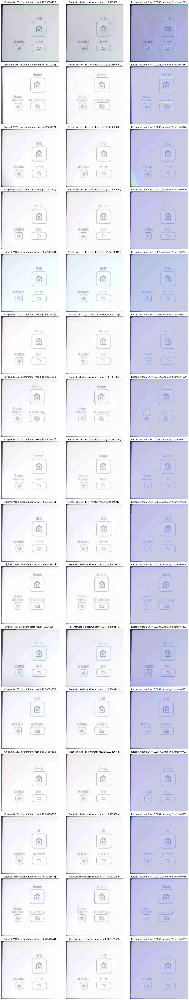

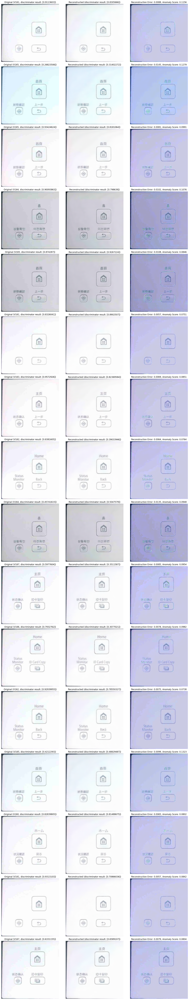

In [21]:
reconstruction(model, balanced_pass_loader, device=device)

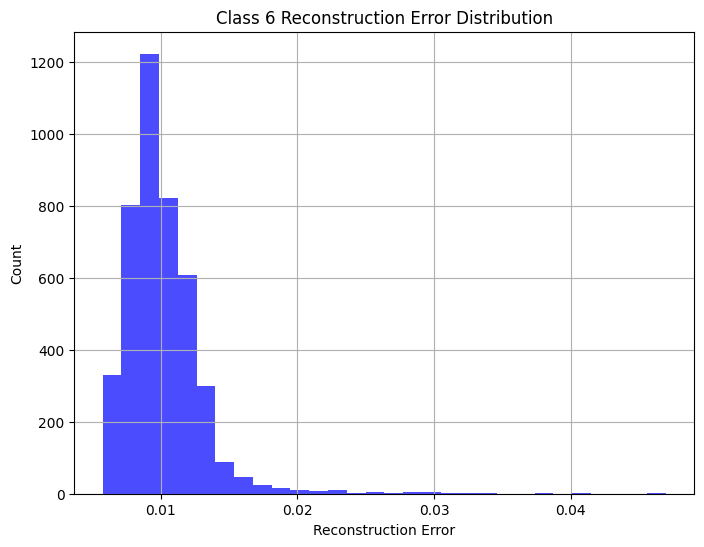

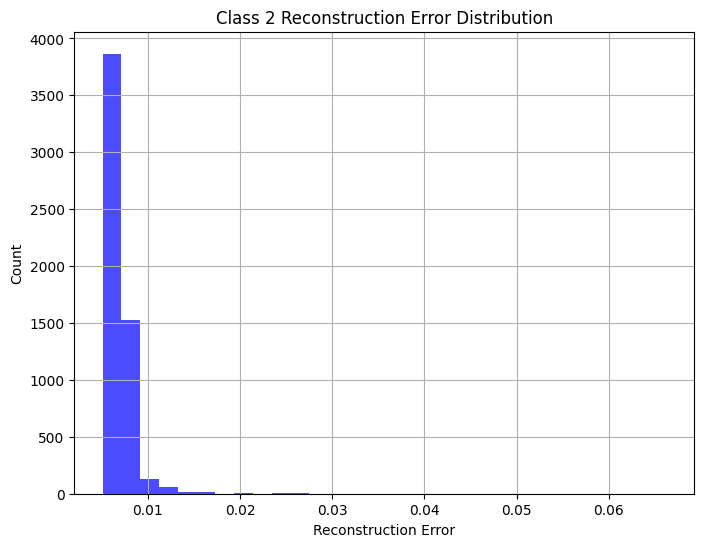

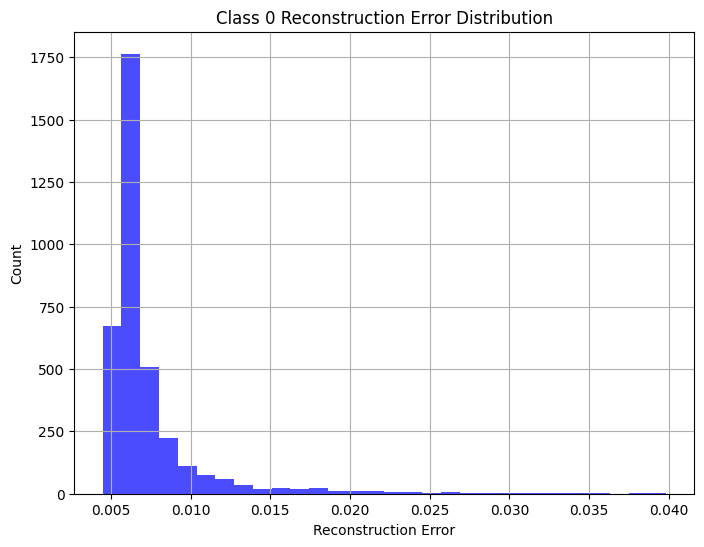

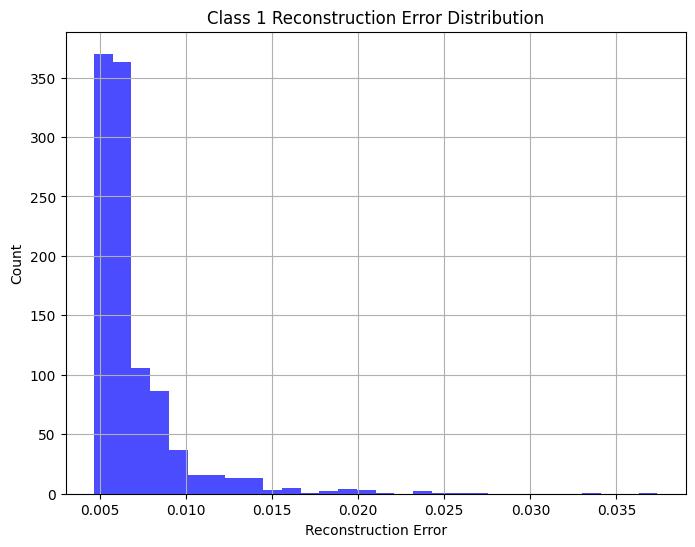

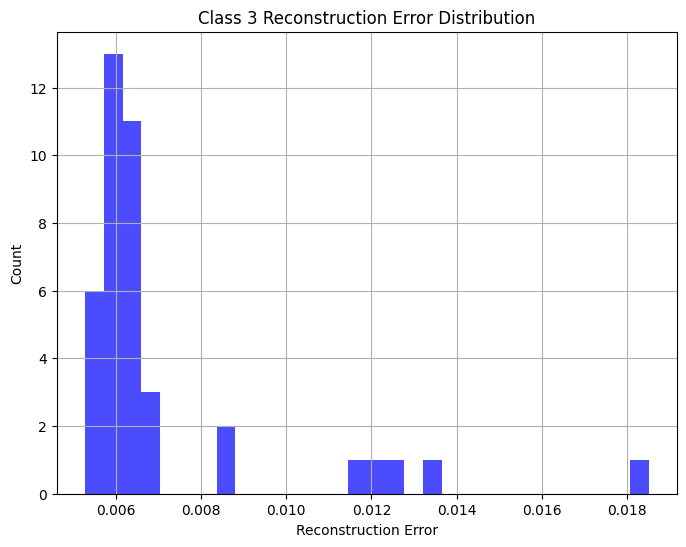

...

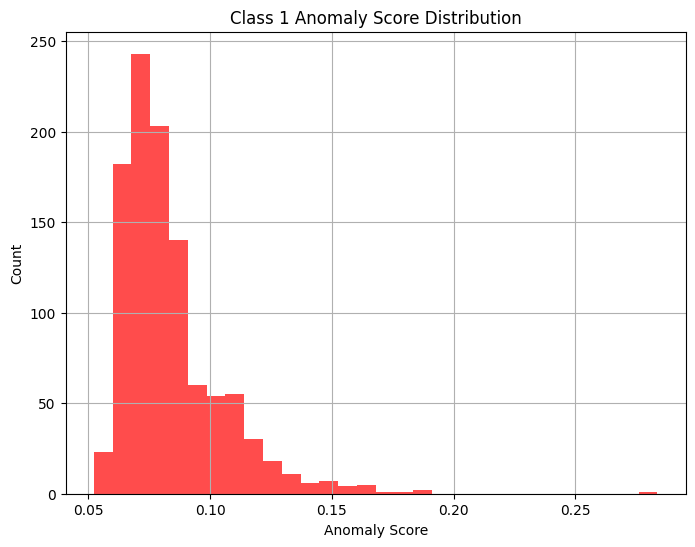

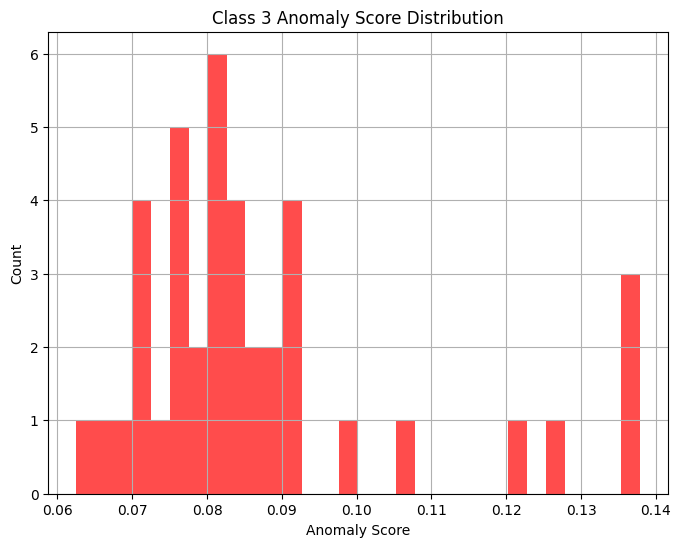

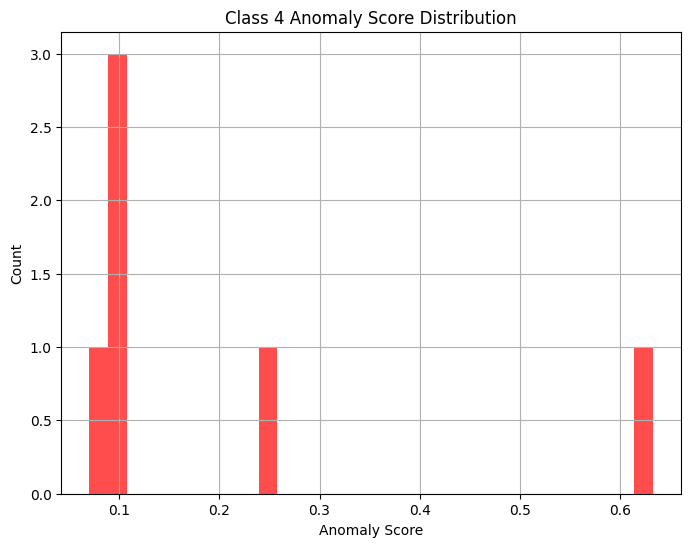

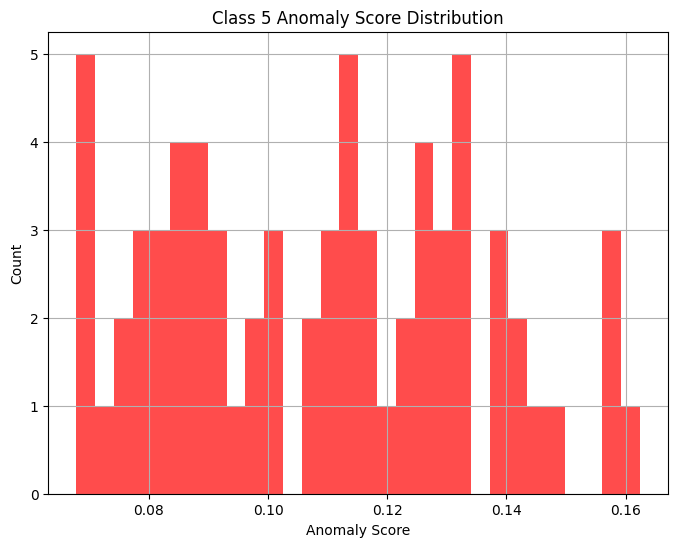

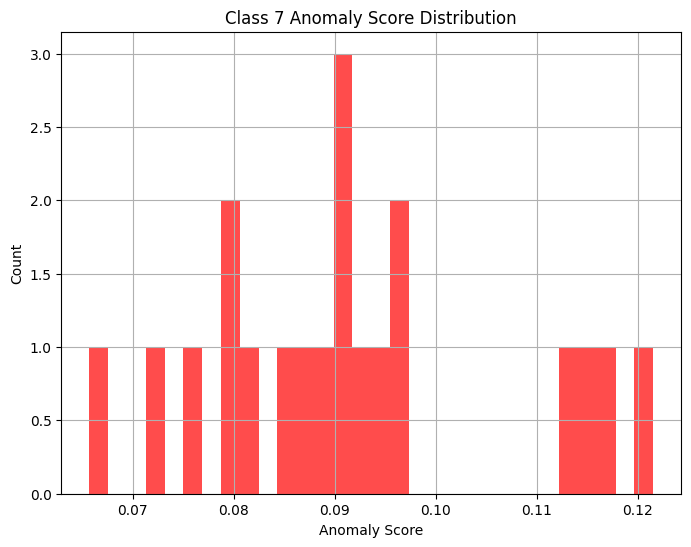

In [22]:
class_recon_errors_pass, class_anomaly_scores_pass = collect_recon_and_anomaly_scores(model, full_pass_loader, device=device)

plot_scores_histogram(class_recon_errors_pass, class_anomaly_scores_pass)

In [23]:
test_dir = "./cropped_data_8/test"  # Pass 폴더 경로
chosen_folder = 'Finger2_Fail_cropped'

balanced_fail_loader, full_fail_loader = get_test_dataloader(test_dir, chosen_folder, batch_size, image_size)

# Pass 데이터 확인
for images, labels in balanced_fail_loader:
    print(f"Pass Batch size: {images.size(0)}")
    print(f"Pass Labels: {labels}")
    break

Pass Batch size: 8
Pass Labels: tensor([4, 3, 0, 6, 1, 7, 2, 5])


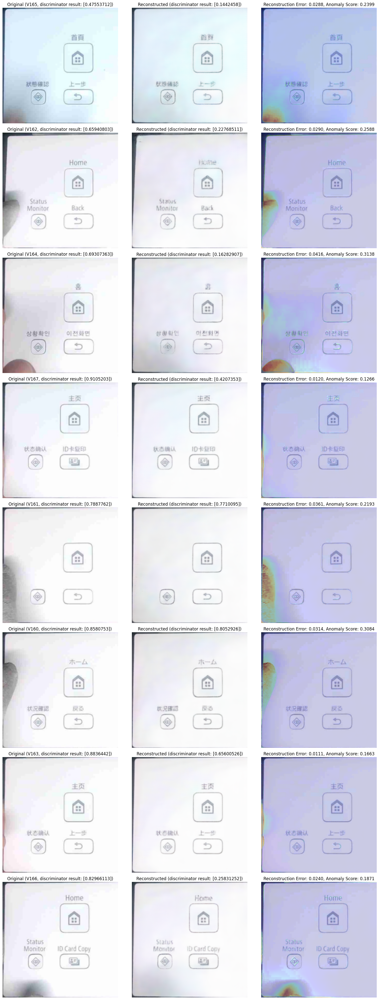

In [24]:
reconstruction(model, balanced_fail_loader, device=device)

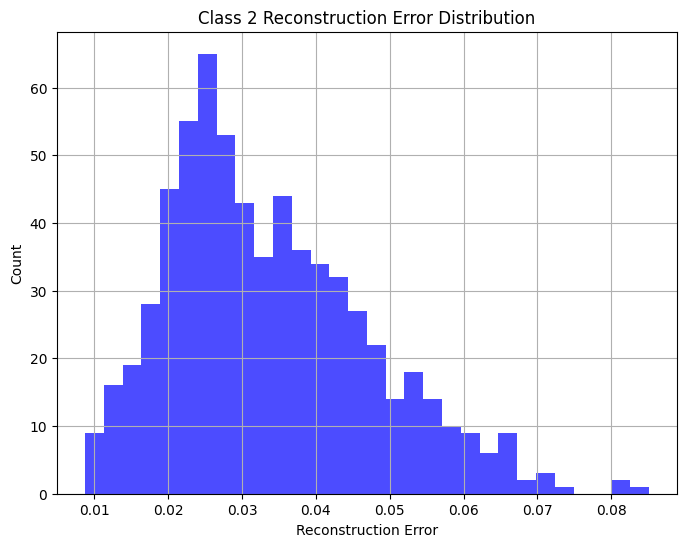

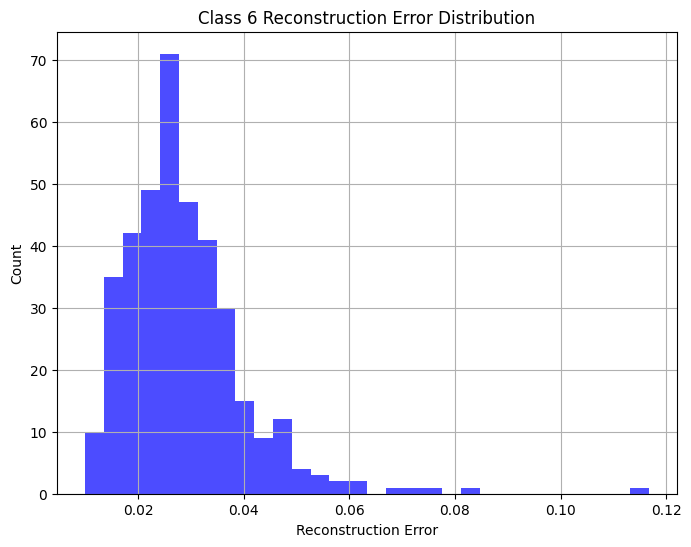

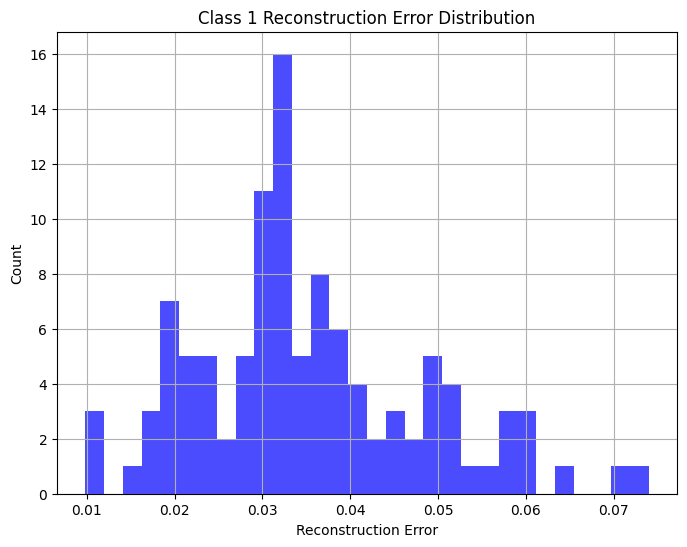

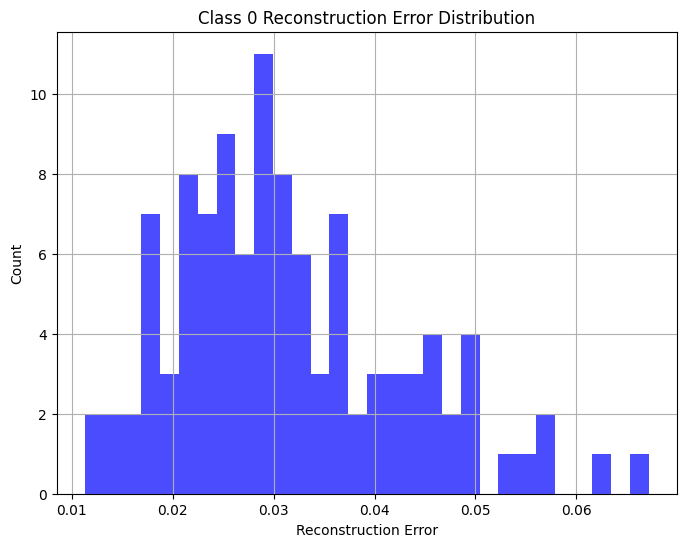

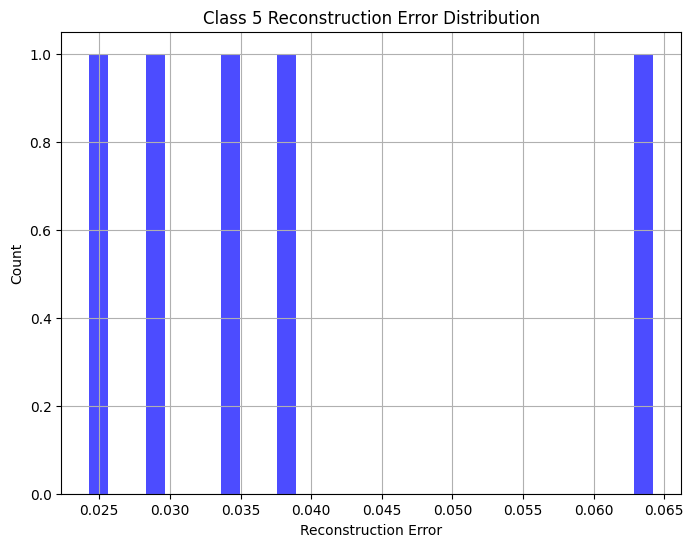

...

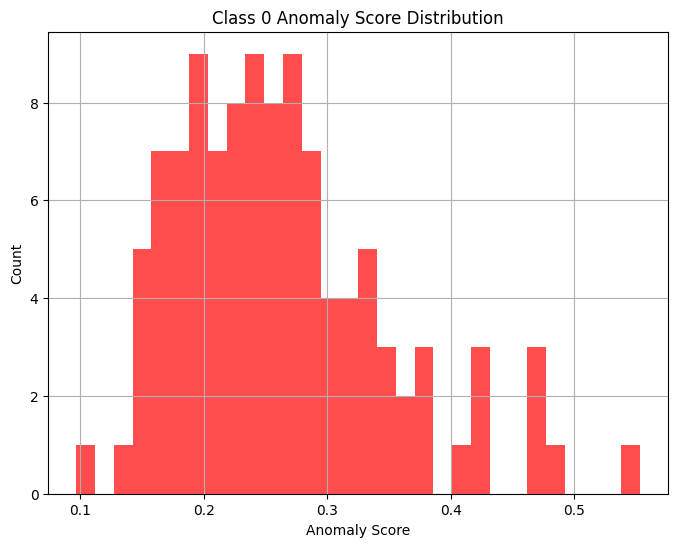

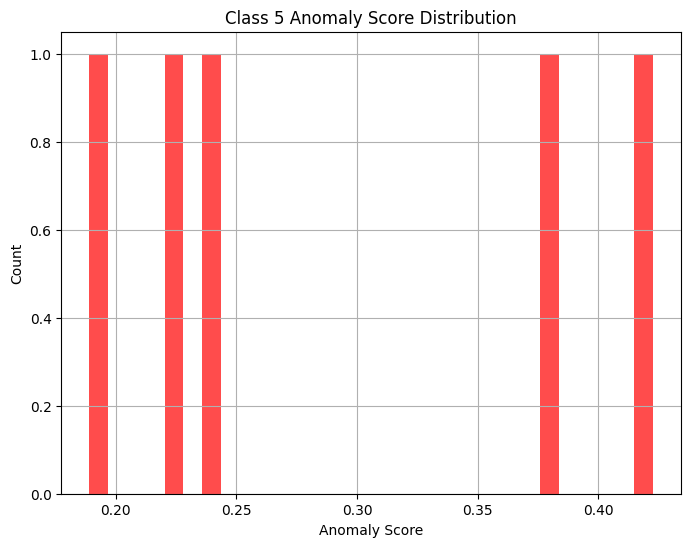

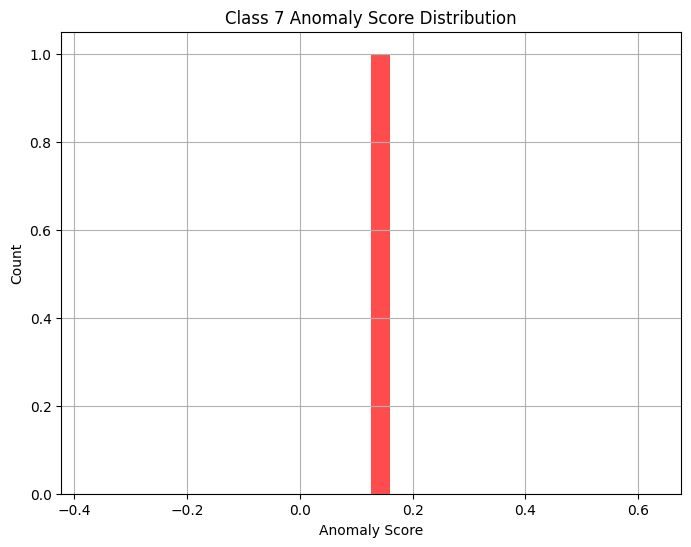

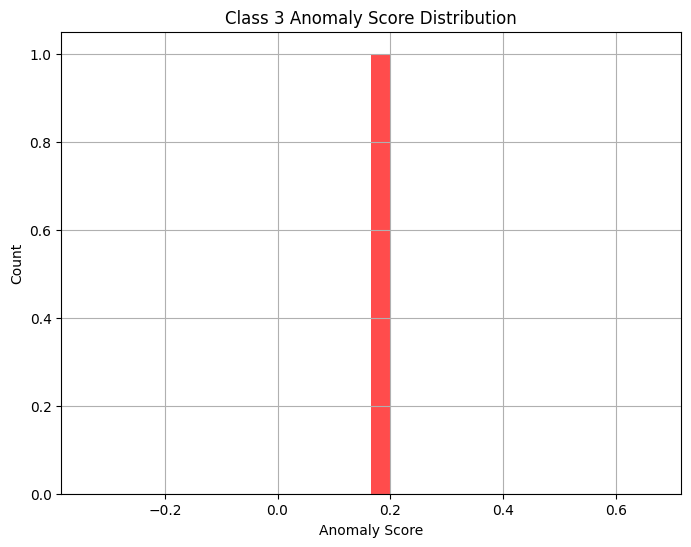

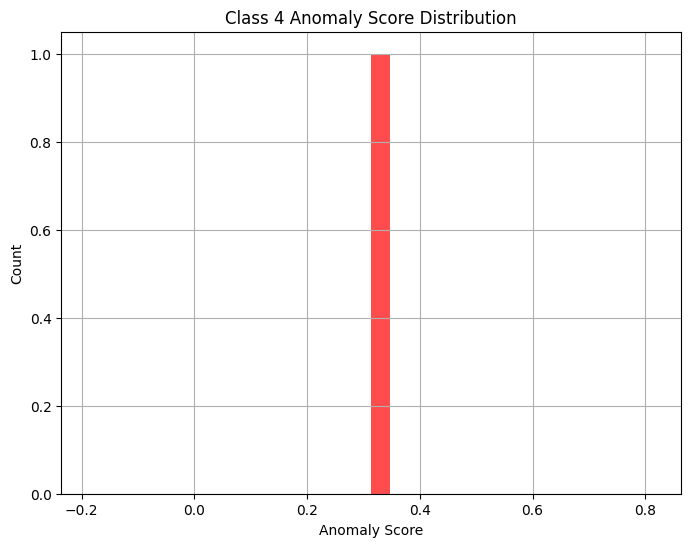

In [25]:
class_recon_errors_fail, class_anomaly_scores_fail = collect_recon_and_anomaly_scores(model, full_fail_loader, device=device)

plot_scores_histogram(class_recon_errors_fail, class_anomaly_scores_fail)

In [26]:
def plot_pass_fail_histogram(class_recon_errors_pass, class_anomaly_scores_pass,
                             class_recon_errors_fail, class_anomaly_scores_fail,
                             recon_weight=0.5):
    """
    pass와 fail에 대한 재구성 오류와 anomaly score를 비교하기 위한 히스토그램 시각화.
    추가로, 두 값의 가중 합 또한 시각화하며, 여기서는 min-max 스케일링을 적용.
    anomaly score와 reconstruction error를 축으로 하는 scatter plot도 추가.

    Args:
        class_recon_errors_pass (dict): {class_label: [recon_errors]} for pass
        class_anomaly_scores_pass (dict): {class_label: [anomaly_scores]} for pass
        class_recon_errors_fail (dict): {class_label: [recon_errors]} for fail
        class_anomaly_scores_fail (dict): {class_label: [anomaly_scores]} for fail
        recon_weight (float): 재구성 오류에 대한 가중치 (anomaly score 가중치는 1 - recon_weight)
    """

    # 재구성 오류 비교
    common_classes = set(class_recon_errors_pass.keys()) & set(class_recon_errors_fail.keys())

    for cls in common_classes:
        errors_pass = class_recon_errors_pass[cls]
        errors_fail = class_recon_errors_fail[cls]

        plt.figure(figsize=(8,6))
        plt.hist(errors_pass, bins=30, alpha=0.7, color='blue', label='Pass')
        plt.hist(errors_fail, bins=30, alpha=0.7, color='red', label='Fail')
        plt.title(f"V16{cls} Reconstruction Error Distribution (Pass vs Fail)")
        plt.xlabel("Reconstruction Error")
        plt.ylabel("Count")
        plt.grid(True)
        plt.legend()
        plt.show()

    # anomaly score 비교
    common_classes_anomaly = set(class_anomaly_scores_pass.keys()) & set(class_anomaly_scores_fail.keys())

    for cls in common_classes_anomaly:
        scores_pass = class_anomaly_scores_pass[cls]
        scores_fail = class_anomaly_scores_fail[cls]

        plt.figure(figsize=(8,6))
        plt.hist(scores_pass, bins=30, alpha=0.7, color='blue', label='Pass')
        plt.hist(scores_fail, bins=30, alpha=0.7, color='red', label='Fail')
        plt.title(f"V16{cls} Anomaly Score Distribution (Pass vs Fail)")
        plt.xlabel("Anomaly Score")
        plt.ylabel("Count")
        plt.grid(True)
        plt.legend()
        plt.show()

    # 가중 합 점수 비교 (공통 클래스에 대해)
    common_classes_combined = common_classes & common_classes_anomaly

    for cls in common_classes_combined:
        errors_pass = class_recon_errors_pass[cls]
        scores_pass = class_anomaly_scores_pass[cls]
        errors_fail = class_recon_errors_fail[cls]
        scores_fail = class_anomaly_scores_fail[cls]

        combined_pass = [recon_weight*e + (1.0 - recon_weight)*s for e, s in zip(errors_pass, scores_pass)]
        combined_fail = [recon_weight*e + (1.0 - recon_weight)*s for e, s in zip(errors_fail, scores_fail)]

        # Min-Max 스케일링
        all_values = combined_pass + combined_fail
        min_val = min(all_values)
        max_val = max(all_values)
        range_val = max_val - min_val if max_val != min_val else 1e-8

        scaled_pass = [(v - min_val)/range_val for v in combined_pass]
        scaled_fail = [(v - min_val)/range_val for v in combined_fail]

        plt.figure(figsize=(8,6))
        plt.hist(scaled_pass, bins=30, alpha=0.7, color='blue', label='Pass')
        plt.hist(scaled_fail, bins=30, alpha=0.7, color='red', label='Fail')
        plt.title(f"V16{cls} Combined Score Distribution (Pass vs Fail, Min-Max Scaled)")
        plt.xlabel("Combined Score (Scaled)")
        plt.ylabel("Count")
        plt.grid(True)
        plt.legend()
        plt.show()

    # Scatter plot for anomaly score vs reconstruction error
    for cls in common_classes_combined:
        errors_pass = class_recon_errors_pass[cls]
        scores_pass = class_anomaly_scores_pass[cls]
        errors_fail = class_recon_errors_fail[cls]
        scores_fail = class_anomaly_scores_fail[cls]

        plt.figure(figsize=(12,12))
        plt.scatter(errors_pass, scores_pass, s=4, alpha=0.6, color='blue', label='Pass')
        plt.scatter(errors_fail, scores_fail, s=4, alpha=0.6, color='red', label='Fail')
        plt.title(f"V16{cls} Scatter Plot (Pass vs Fail)")
        plt.xlabel("Reconstruction Error")
        plt.ylabel("Anomaly Score")
        plt.grid(True)
        plt.legend()
        plt.show()


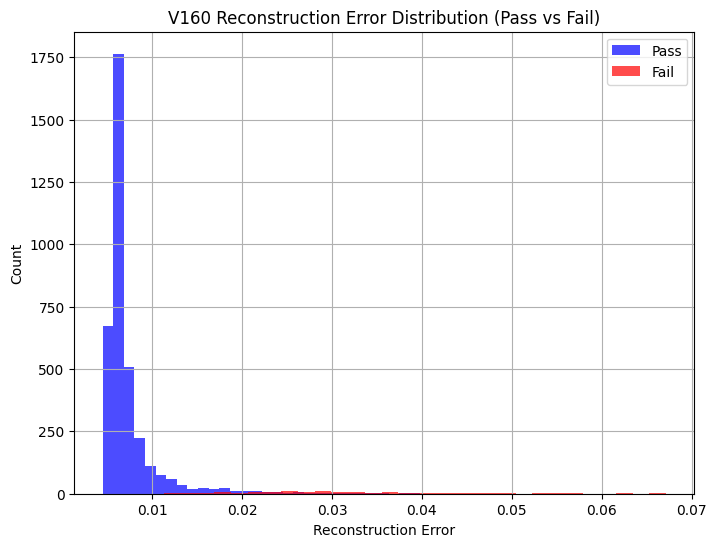

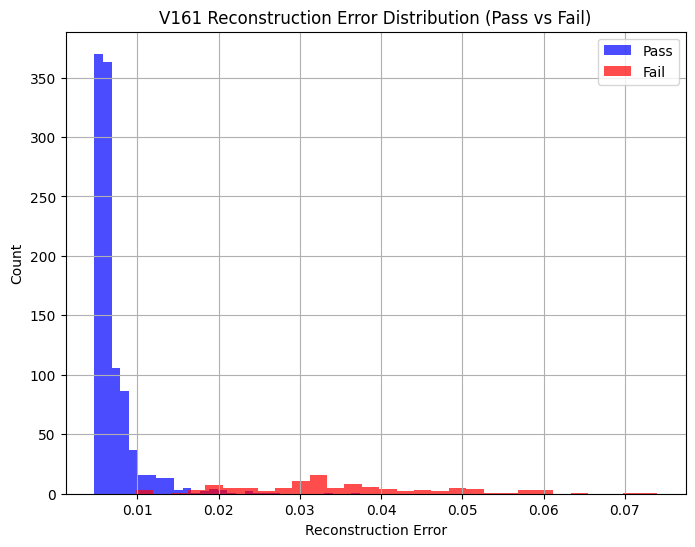

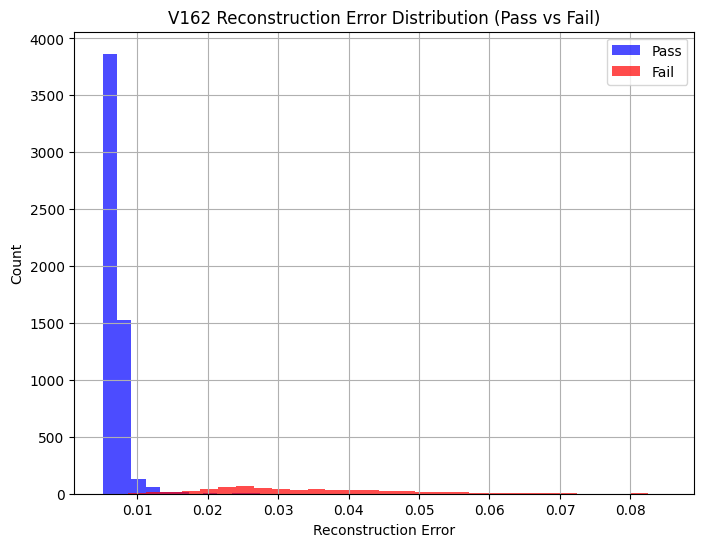

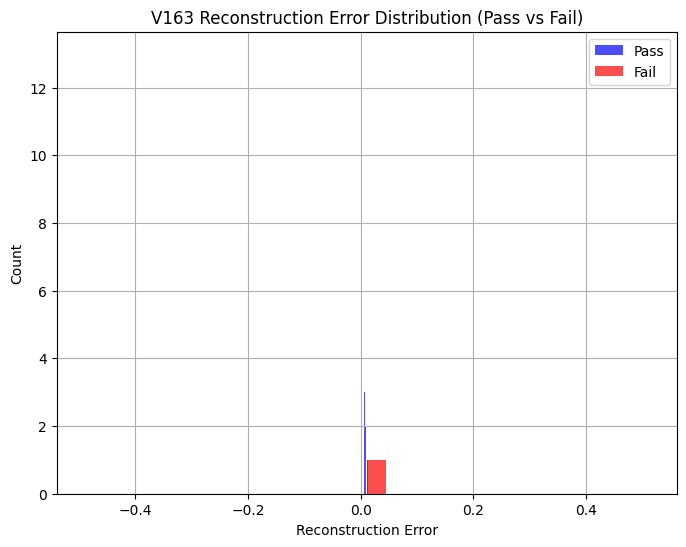

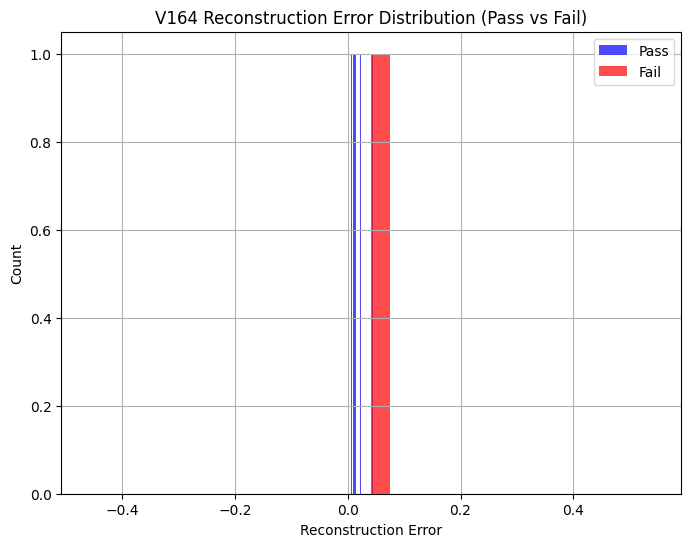

...

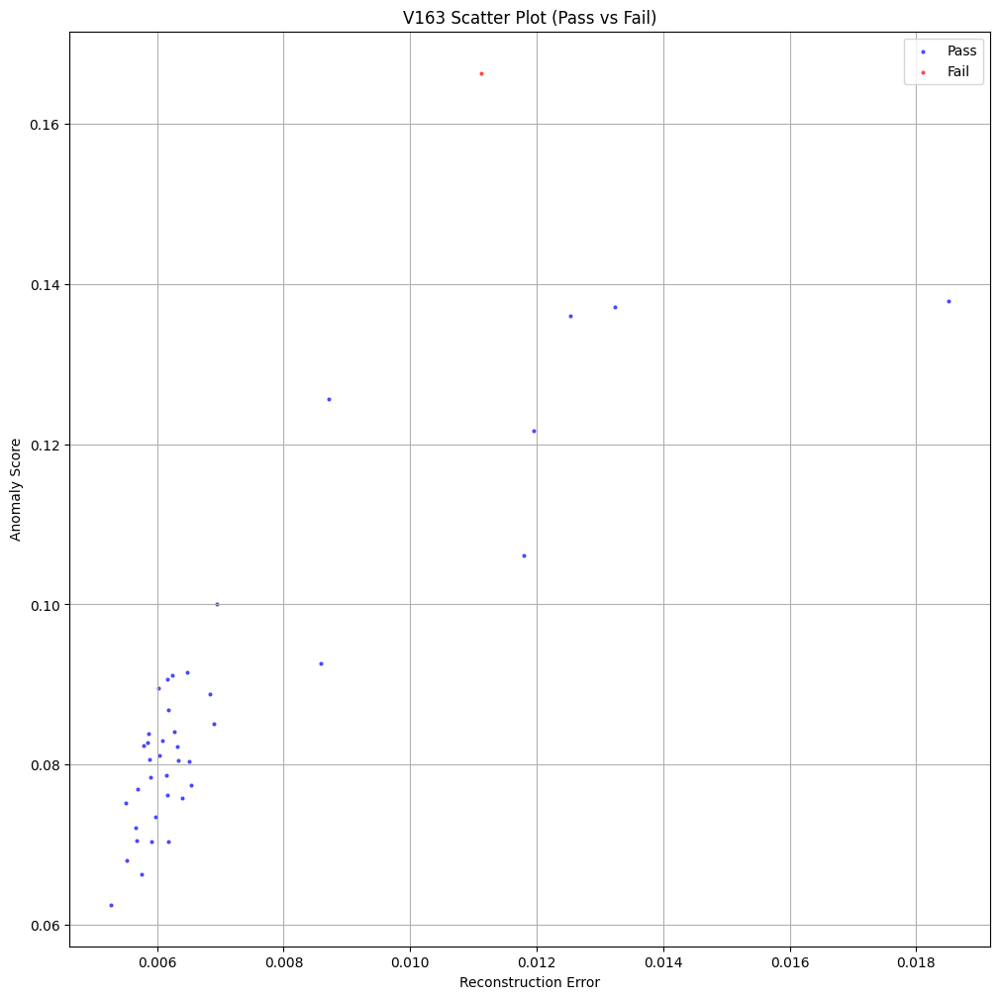

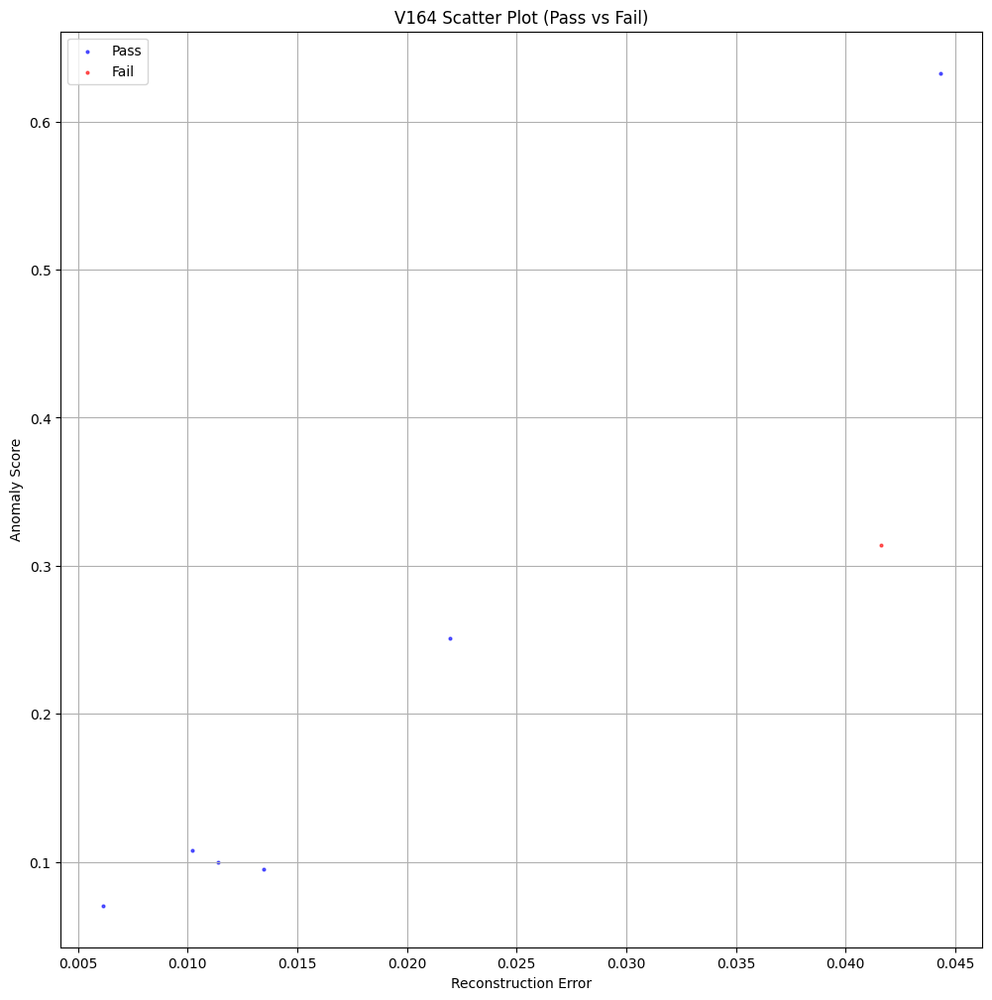

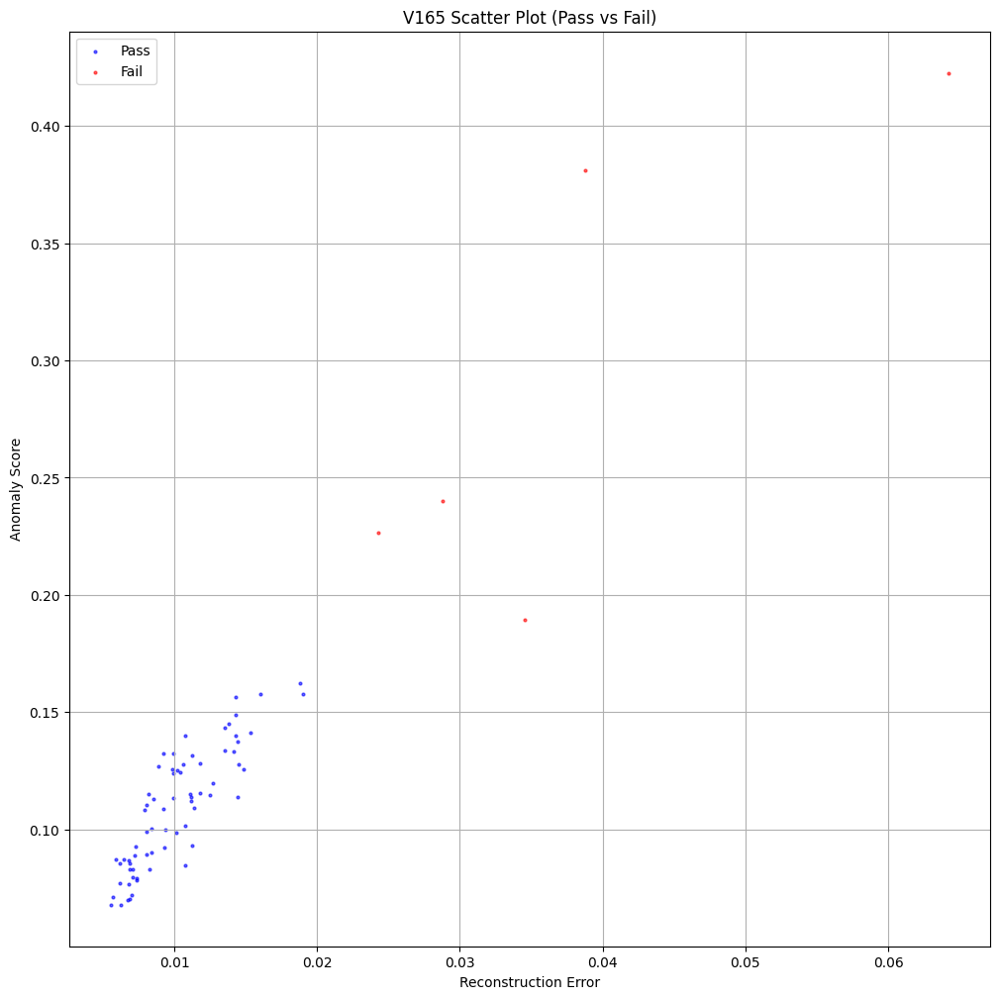

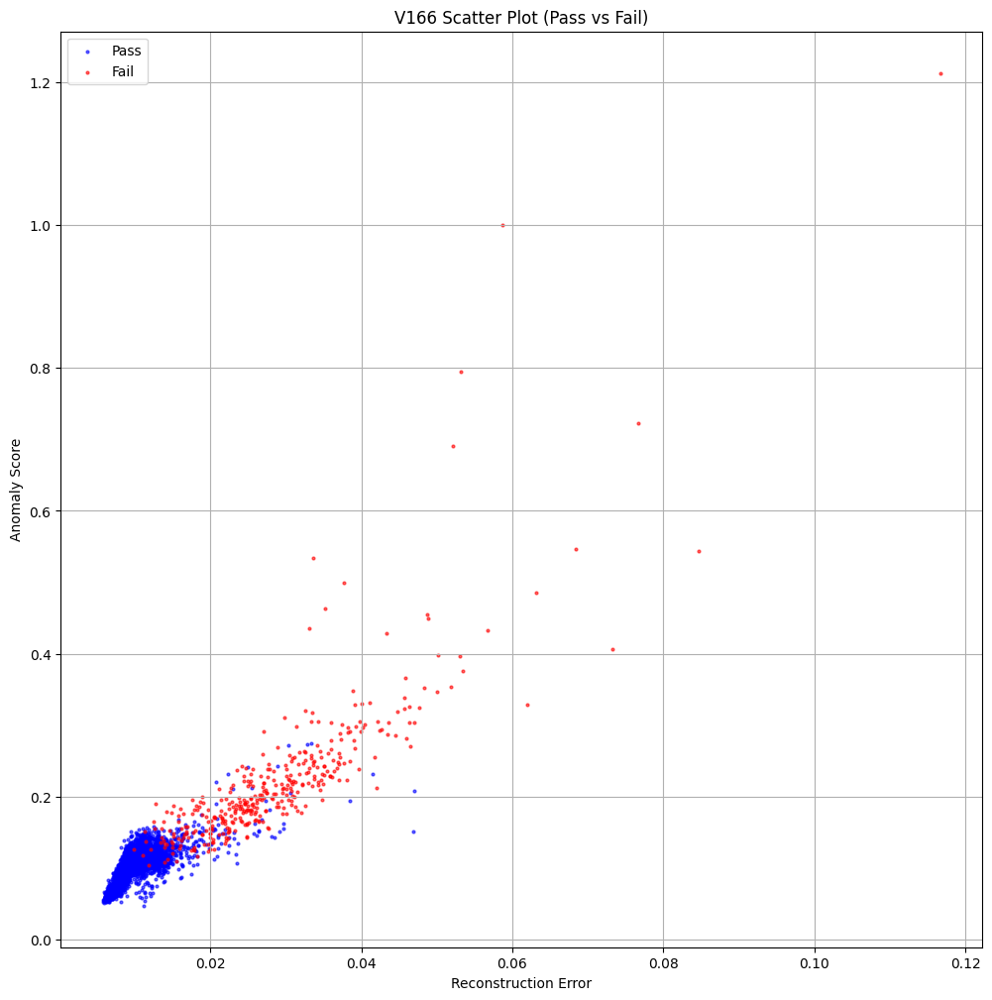

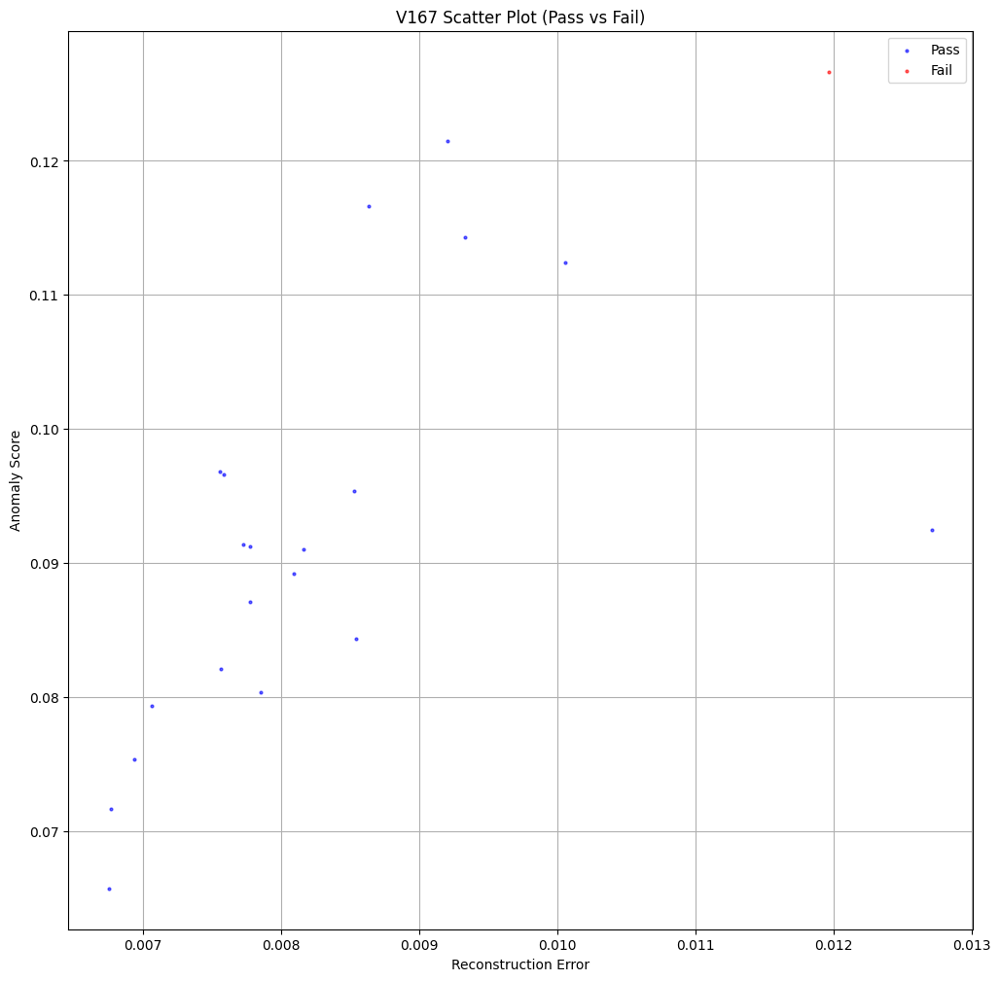

In [27]:
plot_pass_fail_histogram(class_recon_errors_pass, class_anomaly_scores_pass,
                         class_recon_errors_fail, class_anomaly_scores_fail)